In [1]:
from __future__ import print_function, division, absolute_import
import os
import sys
sys.path.insert(0, "C:\\Users\\Matt\\Desktop\\orbithunter\\")
from orbithunter import *
import numpy as np
import itertools
from math import pi
import matplotlib.pyplot as plt
from orbithunter.arrayops import swap_modes
%matplotlib inline
import time
from scipy.optimize import root

C:\ProgramData\Anaconda3\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


There are many many different ways to generate initial conditions, the easiest of which is to simply generate
random modes, and then scale them to the relevant scales. 

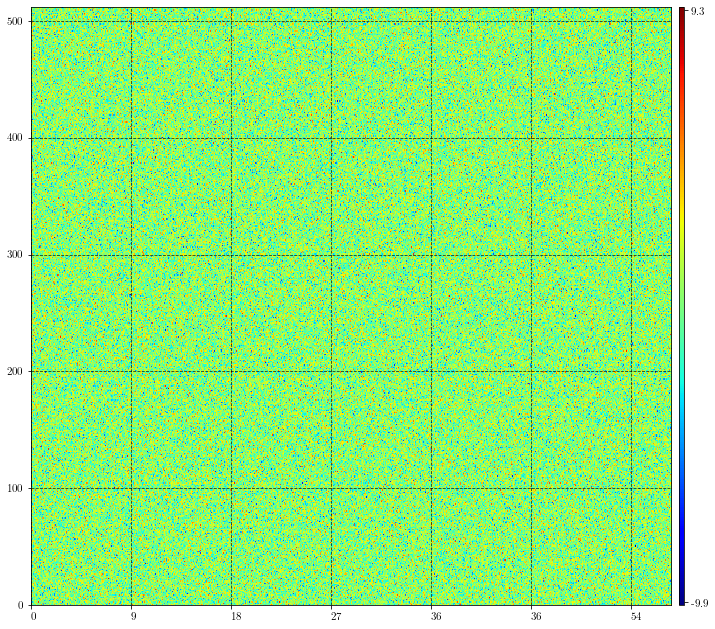

In [7]:
o = OrbitKS(T=512, L=512, seed=0, magnitude=10)
o.plot()

In [6]:
o

OrbitKS({"state_type": "modes", "T": "5.12e+02", "L": "5.12e+02", "N": "128", "M": "128"})

In [8]:
tmp = converge(o, method='grad', orbit_maxiter=100, preconditioning=False, verbose=True)



Starting gradient descent. Initial residual=65268215025.835785, target=0.522242
######### Residual=1231587193.8095999 after 10 gradient descent iterations
######### Residual=1211253128.7977815 after 20 gradient descent iterations
######### Residual=1192777973.352348 after 30 gradient descent iterations
######### Residual=1175650068.742102 after 40 gradient descent iterations
######### Residual=1159571510.9814434 after 50 gradient descent iterations
######### Residual=1144353394.860225 after 60 gradient descent iterations
######### Residual=1129867044.7998843 after 70 gradient descent iterations
######### Residual=1116019456.199784 after 80 gradient descent iterations
######### Residual=1102740070.3381176 after 90 gradient descent iterations
######### Residual=1089973224.3319094 after 100 gradient descent iterations

Failed to converge. Maximum number of iterations reached. exiting with residual 1089973224.3319094


{'T': 118200.0679928848,
 'L': 507014.2022394324,
 'S': 0.0,
 'N': 512,
 'M': 1024,
 'n': 255,
 'm': 511,
 'mode_shape': (511, 1022),
 'field_shape': (512, 1024),
 's_mode_shape': (512, 1022),
 'dx': (507014.2022394324, 1024, 511, 511),
 'dt': (118200.0679928848, 512, 255, 1022)}

In [9]:
print(tmp.orbit.parameters)

{'T': 118200.0679928848, 'L': 507014.2022394324, 'S': 0.0, 'N': 512, 'M': 1024, 'n': 255, 'm': 511, 'mode_shape': (511, 1022), 'field_shape': (512, 1024), 's_mode_shape': (512, 1022), 'dx': (507014.2022394324, 1024, 511, 511), 'dt': (118200.0679928848, 512, 255, 1022)}


In [69]:

N = 256
M = 256
T = 512
L = 512
n, m = int(N // 2) - 1, int(M // 2) - 1
sms = int(L / (2*pi*np.sqrt(2)))
tms = int(np.sqrt(T/10))
sigma_time = np.sqrt(tms)
sigma_space = np.sqrt(sms)

In [70]:
int(np.sqrt(T/10))

7

In [71]:
tms, sms, sigma_space, sigma_time

(7, 57, 7.54983443527075, 2.6457513110645907)

In [106]:
sms = int(L / (2*pi*np.sqrt(2)))
tms = int(np.sqrt(T/10))
sigma_time = np.sqrt(tms)
sigma_space = np.sqrt(sms)

In [18]:
tscale = 1
xscale =  int(L / (2*pi*np.sqrt(2)))
x_var = xscale
t_var = tscale

In [146]:
o = OrbitKS(T=512, L=512, seed=0, magnitude=0.5, rescaling_method='power', spectrum='exponential', tscale=1, xscale=m, xvar=20, tvar=t_var).rescale(3,rescaling_method='absolute')

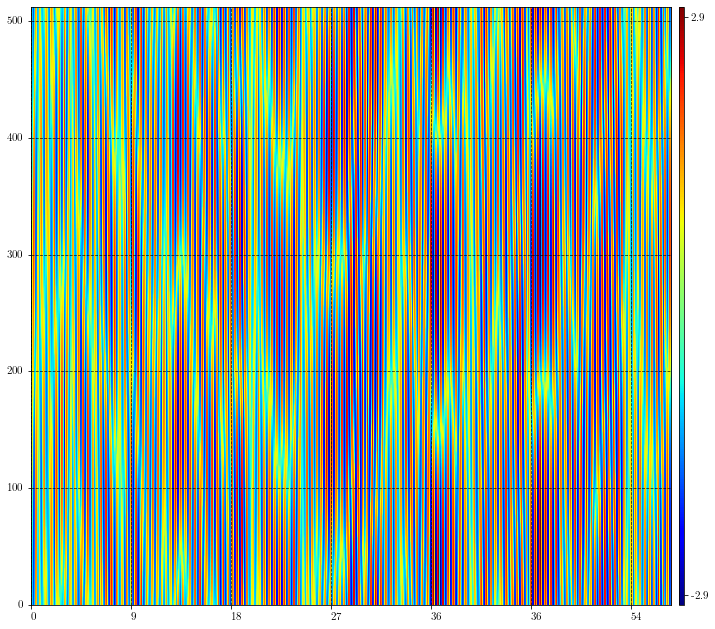

In [147]:
o.plot()

In [ ]:
tscale, xscale, x_var, t_var = (7, 57, 7.54983443527075, 2.6457513110645907)
large_orbit_guess = OrbitKS(T=512, L=512, seed=0, magnitude=0.4, rescaling_method='power', spectrum='random', tscale=tscale, xscale=xscale, xvar=x_var, tvar=t_var)
large_orbit_guess = large_orbit_guess.rescale(magnitude=3, rescaling_method='absolute')

In [ ]:
tscale, xscale, x_var, t_var = (7, 57, 7.54983443527075, 2.6457513110645907)
large_orbit_guess = OrbitKS(T=512, L=512, seed=0, magnitude=0.4, rescaling_method='power', spectrum='gaussian', tscale=tscale, xscale=xscale, xvar=x_var, tvar=t_var)
large_orbit_guess = large_orbit_guess.rescale(magnitude=3, rescaling_method='absolute')

In [76]:
tscale, xscale, x_var, t_var = (7, 57, 7.54983443527075, 2.6457513110645907)
large_orbit_guess = OrbitKS(T=512, L=512, seed=0, magnitude=0.4, rescaling_method='power', spectrum='gaussian', tscale=tscale, xscale=xscale, xvar=x_var, tvar=t_var)
large_orbit_guess = large_orbit_guess.rescale(magnitude=3, rescaling_method='absolute')

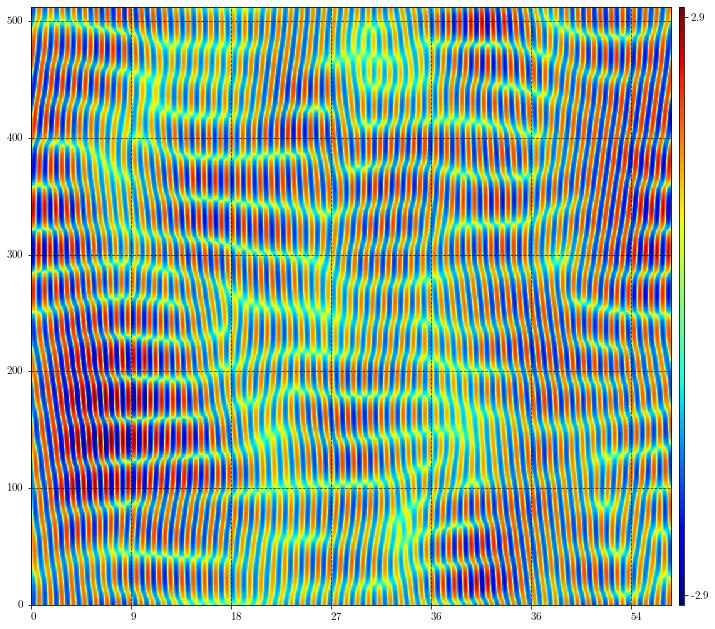

In [77]:
large_orbit_guess.plot()

In [30]:
tmp = converge(large_orbit_guess, method='grad', orbit_maxiter=1000, verbose=True)
tmp.orbit.parameters

Starting gradient descent. Initial residual=532534183.37110096, target=0.522242
######### Residual=1382559.3871175274 after 100 gradient descent iterations
######### Residual=617229.9938119417 after 200 gradient descent iterations
######### Residual=450172.284711483 after 300 gradient descent iterations
######### Residual=349369.6460680652 after 400 gradient descent iterations
######### Residual=274503.96379630757 after 500 gradient descent iterations
######### Residual=217311.9855344099 after 600 gradient descent iterations
######### Residual=173282.96897066516 after 700 gradient descent iterations
######### Residual=139218.9776806061 after 800 gradient descent iterations
######### Residual=112746.24100166987 after 900 gradient descent iterations
######### Residual=92080.32369172978 after 1000 gradient descent iterations

Failed to converge. Maximum number of iterations reached. exiting with residual 92080.32369172978


{'T': 512.0010490304318,
 'L': 512.0000001664935,
 'S': 0.0,
 'N': 512,
 'M': 1024,
 'n': 255,
 'm': 511,
 'mode_shape': (511, 1022),
 'field_shape': (512, 1024),
 's_mode_shape': (512, 1022),
 'dx': (512.0000001664935, 1024, 511, 511),
 'dt': (512.0010490304318, 512, 255, 1022)}

In [32]:
tmp.orbit.residual()

92080.32369172978

In [33]:
tmp_stage_1 = converge(large_orbit_guess, method='grad', orbit_maxiter=500, verbose=True, preconditioning=True)
tmp_stage_2 = converge(tmp_stage_1.orbit, method='grad', orbit_maxiter=500, verbose=True, preconditioning=False)

Starting gradient descent. Initial residual=532534183.37110096, target=0.522242
######### Residual=3548292.93722976 after 50 gradient descent iterations
######### Residual=1382559.3871175274 after 100 gradient descent iterations
######### Residual=813619.3356917972 after 150 gradient descent iterations
######### Residual=617229.9938119417 after 200 gradient descent iterations
######### Residual=518251.9799956991 after 250 gradient descent iterations
######### Residual=450172.284711483 after 300 gradient descent iterations
######### Residual=395623.8001549822 after 350 gradient descent iterations
######### Residual=349369.6460680652 after 400 gradient descent iterations
######### Residual=309364.74549522414 after 450 gradient descent iterations
######### Residual=274503.96379630757 after 500 gradient descent iterations

Failed to converge. Maximum number of iterations reached. exiting with residual 274503.96379630757
Starting gradient descent. Initial residual=274503.96379630757, target

In [34]:
print(tmp_stage_2.orbit.parameters)

{'T': 512.0181312227717, 'L': 530.5253622853037, 'S': 0.0, 'N': 512, 'M': 1024, 'n': 255, 'm': 511, 'mode_shape': (511, 1022), 'field_shape': (512, 1024), 's_mode_shape': (512, 1022), 'dx': (530.5253622853037, 1024, 511, 511), 'dt': (512.0181312227717, 512, 255, 1022)}


In [49]:
o2 = tmp_stage_2.orbit

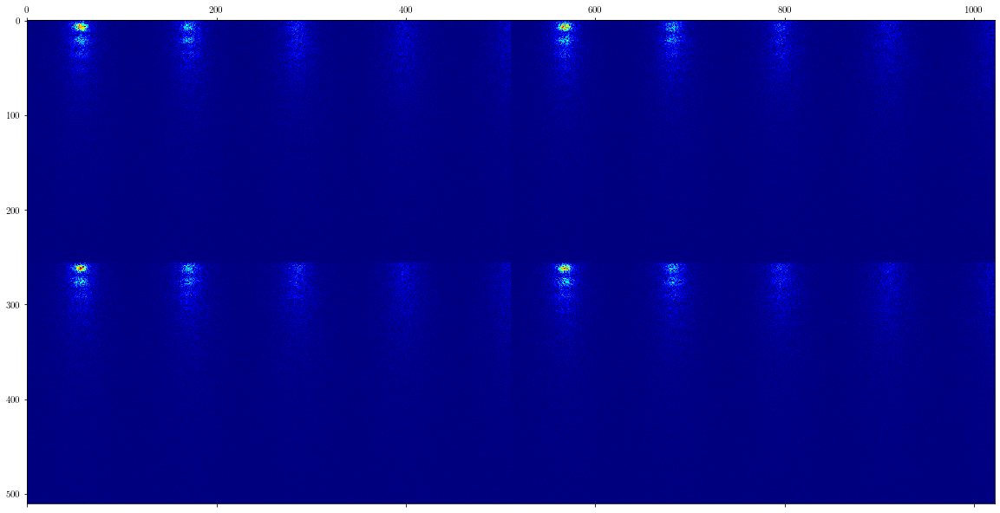

In [81]:
fig, ax = plt.subplots(figsize=(20,20))
ax.matshow(np.log10(np.abs(large_orbit_guess.convert(to='modes').state)+1), cmap='jet')
plt.show()

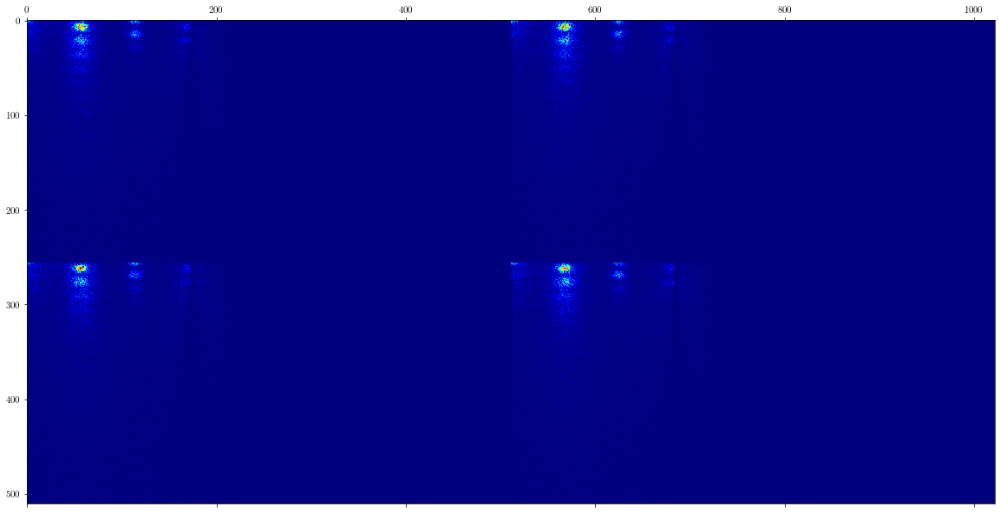

In [63]:
fig, ax = plt.subplots(figsize=(20,20))
ax.matshow(np.log10(np.abs(o2.state)+1), cmap='jet')
plt.show()

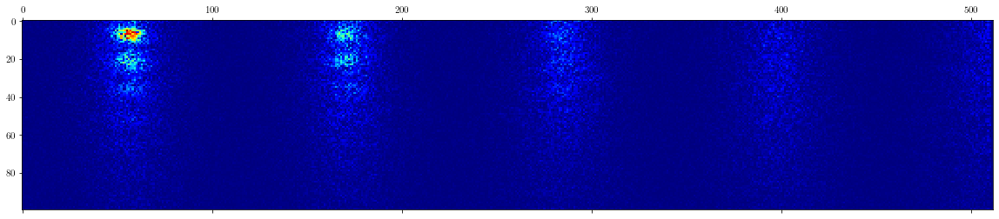

In [74]:
fig, ax = plt.subplots(figsize=(20,20))
ax.matshow(np.log10(np.abs(large_orbit_guess.state[:100,:512])+1), cmap='jet')
plt.show()

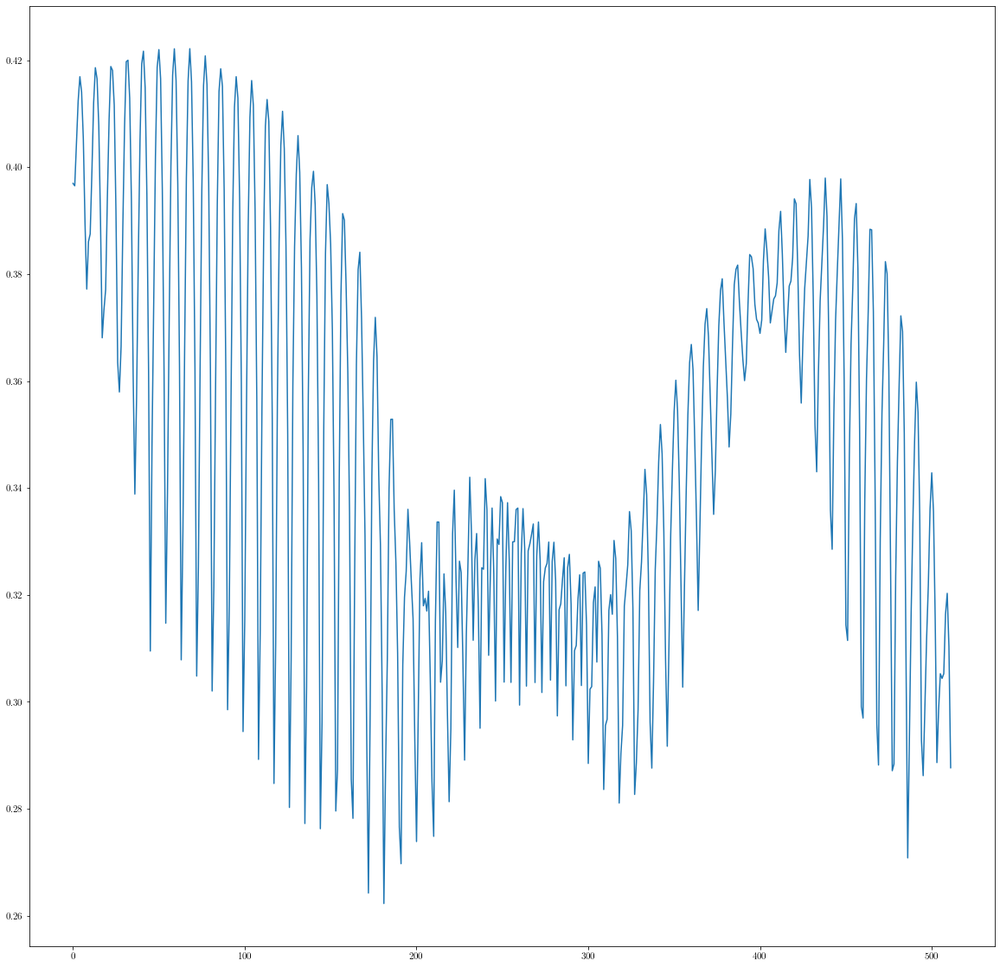

In [82]:
fig, ax = plt.subplots(figsize=(20,20))
ax.plot(np.mean(np.log10(np.abs(large_orbit_guess.state[:100,:512])+1),axis=0))
plt.show()

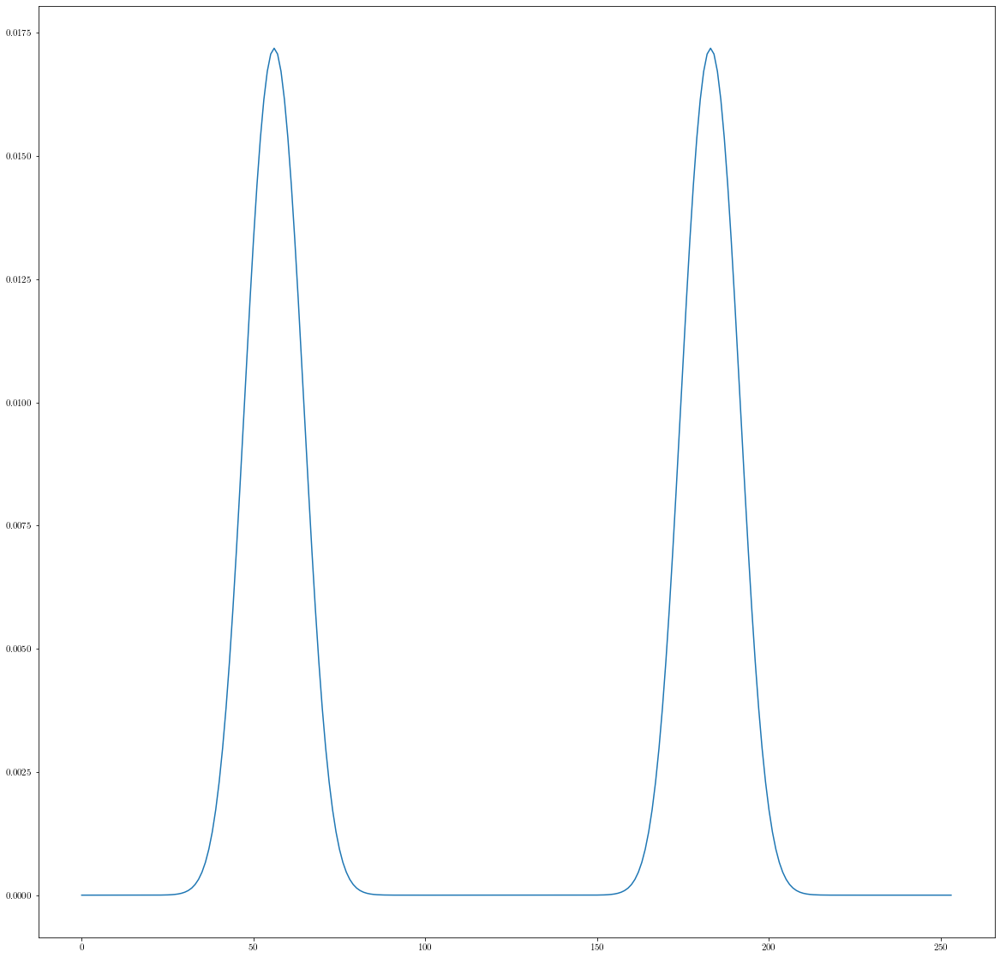

In [86]:
fig, ax = plt.subplots(figsize=(20,20))
ax.plot(np.mean(np.log10(np.abs(mollifier)+1),axis=0))
plt.show()

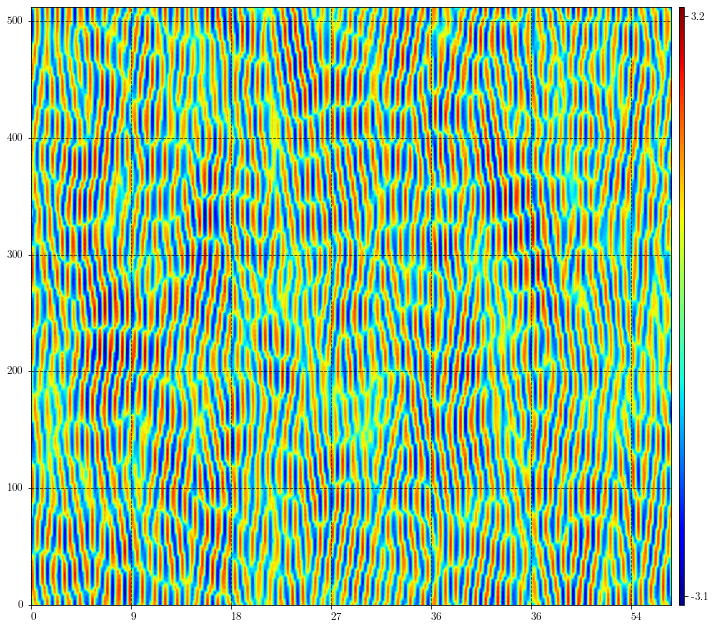

In [95]:
np.random.seed(0)
tester = OrbitKS(state=4*np.random.randn(N,M), state_type='field', T=T, L=L).convert(to='modes')
tester.state = np.random.randn(*tester.state.shape)
space = np.abs((tester.L / (2 * pi)) * tester.elementwise_dxn(tester.parameters['dx']))
time = np.abs((tester.T / (2 * pi)) * tester.elementwise_dtn(tester.parameters['dt']))

mollifier = np.exp(-(space-sms)**2/(2*sigma_space**2)-(time-tms)**2/(2*sigma_time**2))

modes = np.multiply(mollifier, tester.state)
test_orbit = OrbitKS(state=modes, state_type='modes', T=tester.T, L=tester.L)


good_large_guess = OrbitKS(state=np.sign(test_orbit.convert(to='field').state) * np.abs(test_orbit.convert(to='field').state)**(1./3.),
                                                                      state_type='field', T=512, L=512).rescale(2.5, rescaling_method='absolute')
good_large_guess.plot(padding=True)

In [96]:
tmp_stage_1 = converge(good_large_guess, method='grad', orbit_maxiter=5000, verbose=True, preconditioning=True)
tmp_stage_2 = converge(tmp_stage_1.orbit, method='grad', orbit_maxiter=5000, verbose=True, preconditioning=False)

Starting gradient descent. Initial residual=3723.4229232151733, target=0.06477
######### Residual=1961.0042134777693 after 500 gradient descent iterations
######### Residual=1306.3615198949558 after 1000 gradient descent iterations
######### Residual=987.969973076195 after 1500 gradient descent iterations
######### Residual=808.9798474314033 after 2000 gradient descent iterations
######### Residual=697.1752646496222 after 2500 gradient descent iterations
######### Residual=621.5854352437811 after 3000 gradient descent iterations
######### Residual=567.2915060631956 after 3500 gradient descent iterations
######### Residual=526.4130700716361 after 4000 gradient descent iterations
######### Residual=494.4643235050838 after 4500 gradient descent iterations
######### Residual=468.73024850622005 after 5000 gradient descent iterations

Failed to converge. Maximum number of iterations reached. exiting with residual 468.73024850622005
Starting gradient descent. Initial residual=468.730248506220

In [97]:
tmp_stage_2.orbit.parameters

{'T': 532.4134030217714,
 'L': 611.6898438174505,
 'S': 0.0,
 'N': 256,
 'M': 256,
 'n': 127,
 'm': 127,
 'mode_shape': (255, 254),
 'field_shape': (256, 256),
 's_mode_shape': (256, 254),
 'dx': (611.6898438174505, 256, 127, 255),
 'dt': (532.4134030217714, 256, 127, 254)}

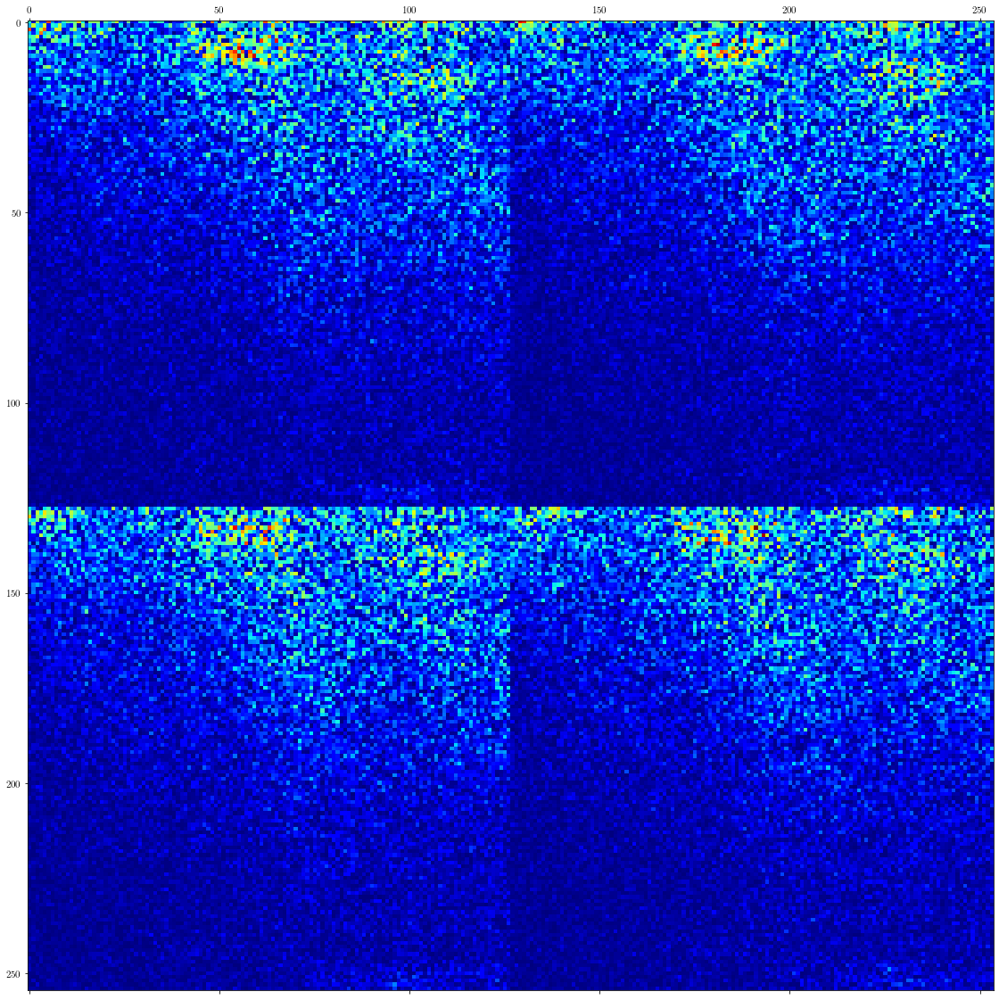

In [103]:
fig, ax = plt.subplots(figsize=(20,20))
ax.matshow(np.log10(np.abs(o2.state - good_large_guess.convert(to='modes').state)+1), cmap='jet')
plt.show()

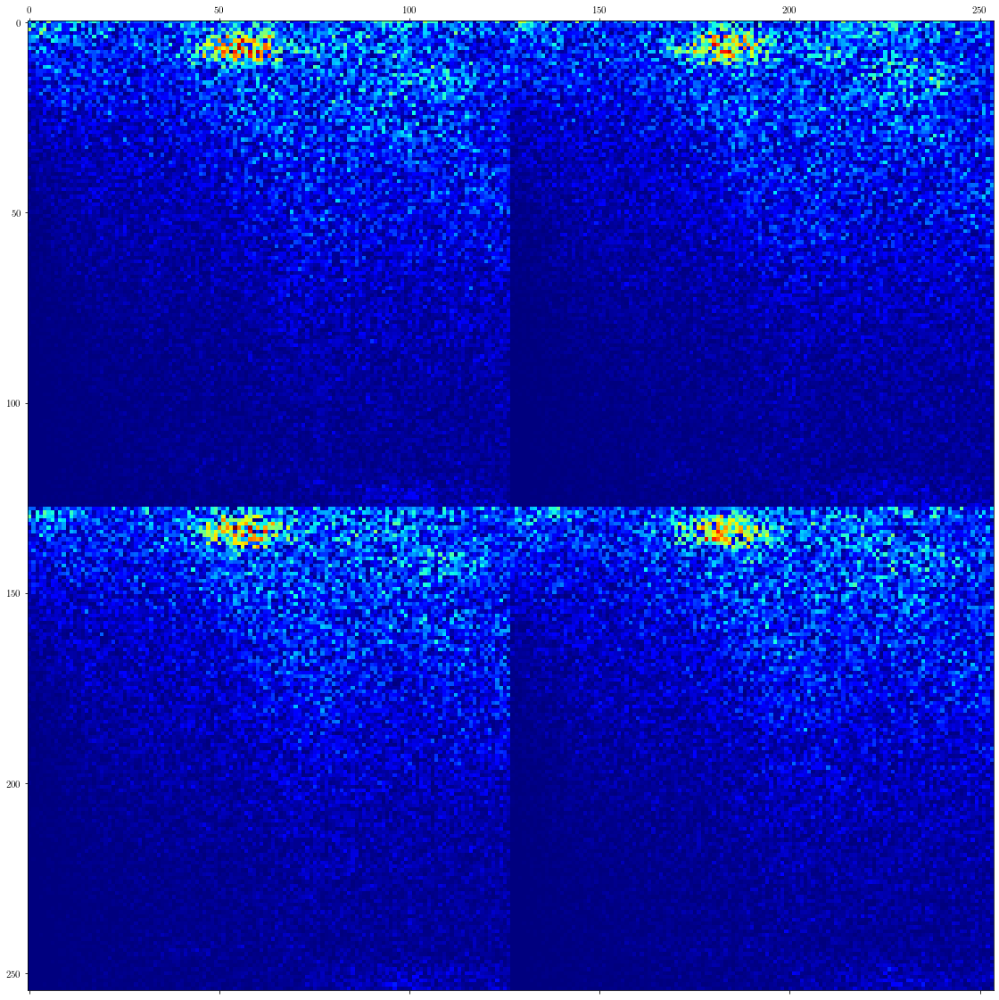

In [104]:
fig, ax = plt.subplots(figsize=(20,20))
ax.matshow(np.log10(np.abs(o2.state)+1), cmap='jet')
plt.show()

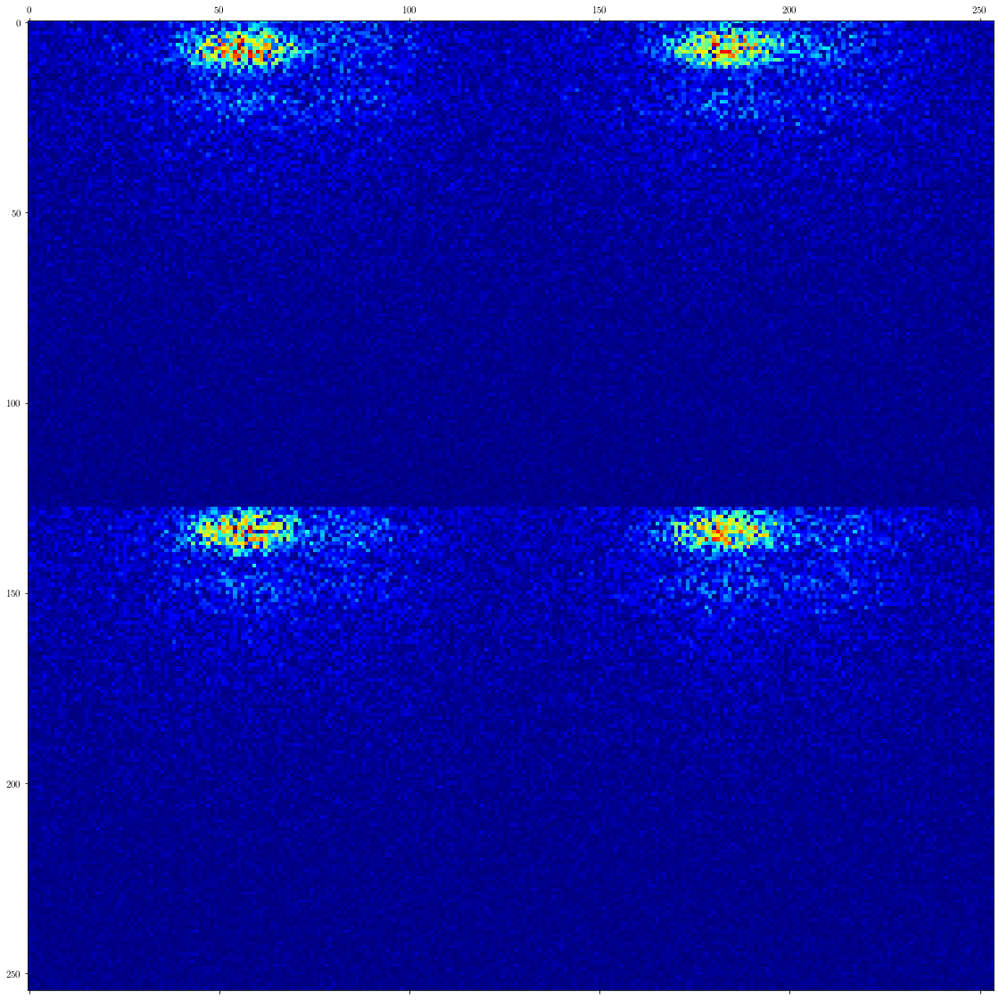

In [105]:
fig, ax = plt.subplots(figsize=(20,20))
ax.matshow(np.log10(np.abs(good_large_guess.convert(to='modes').state)+1), cmap='jet')
plt.show()

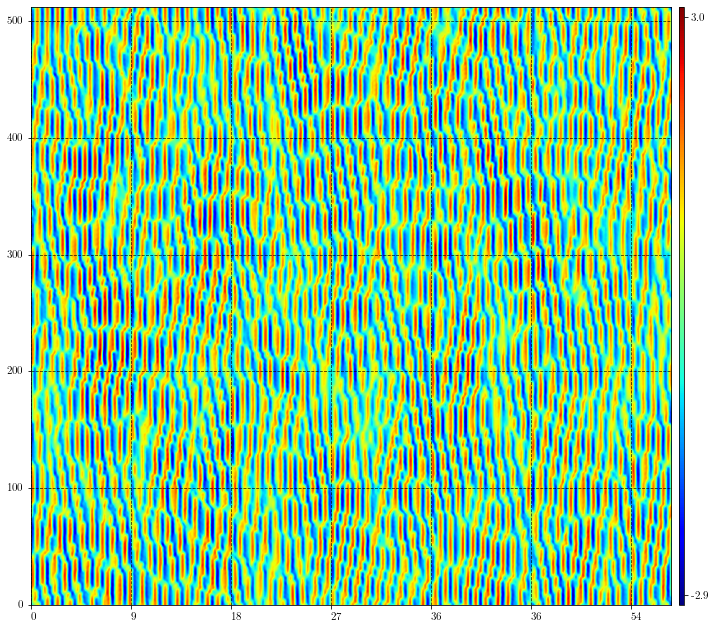

In [101]:
tmp_stage_1.orbit.plot()

In [100]:
o2 = tmp_stage_2.orbit
o2

OrbitKS({"state_type": "modes", "T": "5.32e+02", "L": "6.12e+02", "N": "256", "M": "256"})

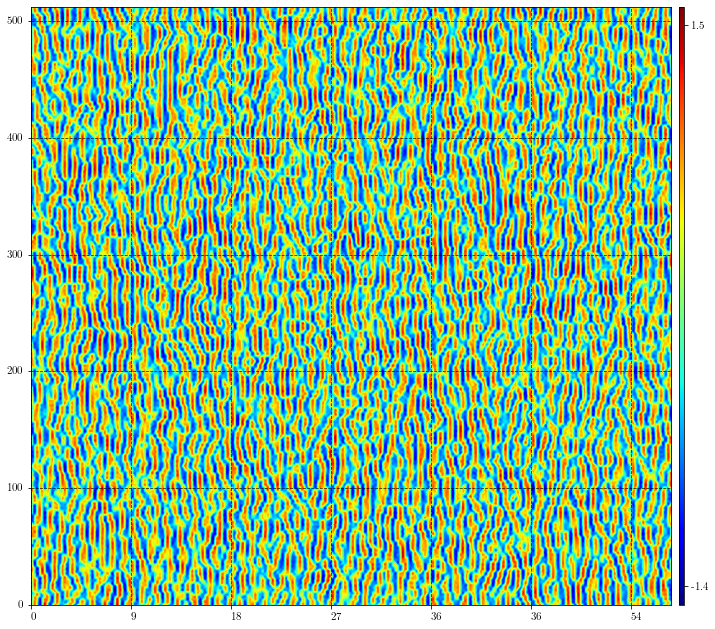

In [11]:
np.random.seed(0)
tester = OrbitKS(state=4*np.random.randn(N,M), state_type='field', T=T, L=L).convert(to='modes')
tester.state = np.random.randn(*tester.state.shape)
space = np.abs((tester.L / (2 * pi)) * tester.elementwise_dxn(tester.parameters['dx']))
time = np.abs((tester.T / (2 * pi)) * tester.elementwise_dtn(tester.parameters['dt']))

mollifier = np.exp(-(space-sms)**2/(2*sigma_space**2)-(time-tms)**2/(2*sigma_time**2))

modes = np.multiply(mollifier, tester.state)
test_orbit = OrbitKS(state=modes, state_type='modes', T=tester.T, L=tester.L)


good_large_guess = OrbitKS(state=np.sign(test_orbit.convert(to='field').state) * np.abs(test_orbit.convert(to='field').state)**(1./3.),
                                                                      state_type='field', T=512, L=512)
good_large_guess.plot(padding=True)

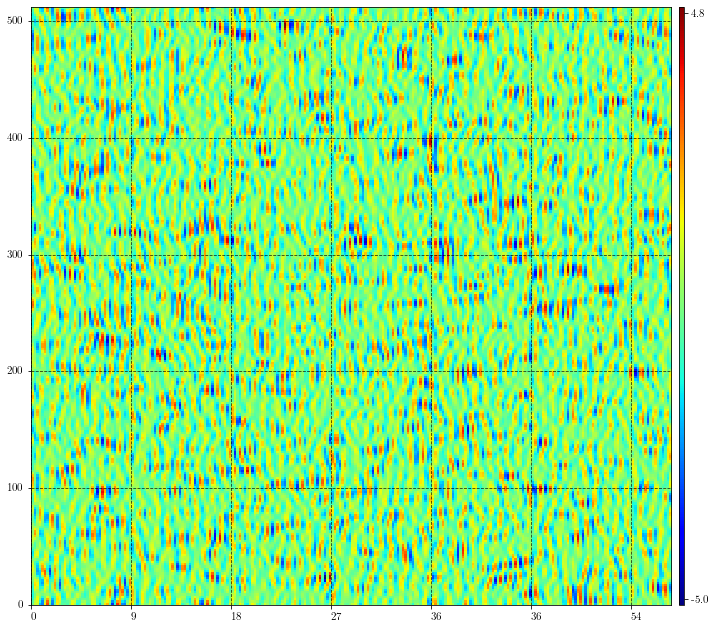

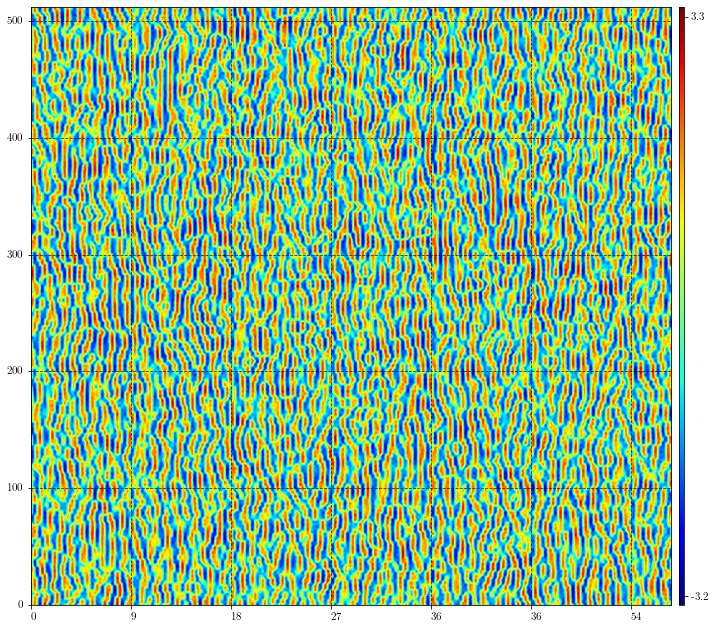

In [14]:
N = 256
M = 256
T = 512
L = 512
n, m = int(N // 2) - 1, int(M // 2) - 1
sms = int(L / (2*pi*np.sqrt(2)))
tms = int(np.sqrt(T/10))

sigma_time = 20
sigma_space = 15

np.random.seed(0)
tester = OrbitKS(state=4*np.random.randn(N,M), state_type='field', T=T, L=L).convert(to='modes')
tester.state = np.random.randn(*tester.state.shape)
space = np.abs((tester.L / (2 * pi)) * tester.elementwise_dxn(tester.parameters['dx']))
time = np.abs((tester.T / (2 * pi)) * tester.elementwise_dtn(tester.parameters['dt']))

mollifier = np.exp(-(space-sms)**2/(2*sigma_space**2)-(time-tms)**2/(2*sigma_time**2))

modes = 3*np.multiply(mollifier, tester.state)
test_orbit = OrbitKS(state=modes, state_type='modes', T=tester.T, L=tester.L)
test_orbit.plot()

good_large_guess2 = OrbitKS(state=np.sign(test_orbit.convert(to='field').state) * np.abs(test_orbit.convert(to='field').state)**(1./3.),
                                                                      state_type='field', T=512, L=512).rescale(2.5)

np.sign(test_orbit.convert(to='field').state) * np.abs(test_orbit.convert(to='field').state)**(1./3.)

good_large_guess2.plot(padding=True)

In [11]:
stage_1_result = converge(good_large_guess2, method='grad', preconditioning=True, orbit_maxiter=2000, verbose=True)
stage_2_result = converge(stage_1_result.orbit, method='grad', preconditioning=False, orbit_maxiter=8000, verbose=True)

Starting gradient descent. Initial residual=5070.761218648743, target=0.06477
######### Residual=912.6833600578711 after 10 gradient descent iterations
######### Residual=435.93045274833605 after 20 gradient descent iterations
######### Residual=308.1979183347456 after 30 gradient descent iterations
######### Residual=258.2501095786808 after 40 gradient descent iterations
######### Residual=227.02388635669473 after 50 gradient descent iterations
######### Residual=204.58574690780875 after 60 gradient descent iterations
######### Residual=187.4322751230441 after 70 gradient descent iterations
######### Residual=173.77275808321644 after 80 gradient descent iterations
######### Residual=162.56242776969233 after 90 gradient descent iterations
######### Residual=153.14320022290616 after 100 gradient descent iterations

Failed to converge. Maximum number of iterations reached. exiting with residual 153.14320022290616


{'T': 522.8375744631023,
 'L': 540.0357317406239,
 'S': 0.0,
 'N': 256,
 'M': 256,
 'n': 127,
 'm': 127,
 'mode_shape': (255, 254),
 'field_shape': (256, 256),
 's_mode_shape': (256, 254),
 'dx': (540.0357317406239, 256, 127, 255),
 'dt': (522.8375744631023, 256, 127, 254)}

In [ ]:
print(tmp_res.orbit.parameters)

In [41]:
tmp_res.orbit.plot()

NameError: name 'tmp_res' is not defined

#### Gaussian with different std

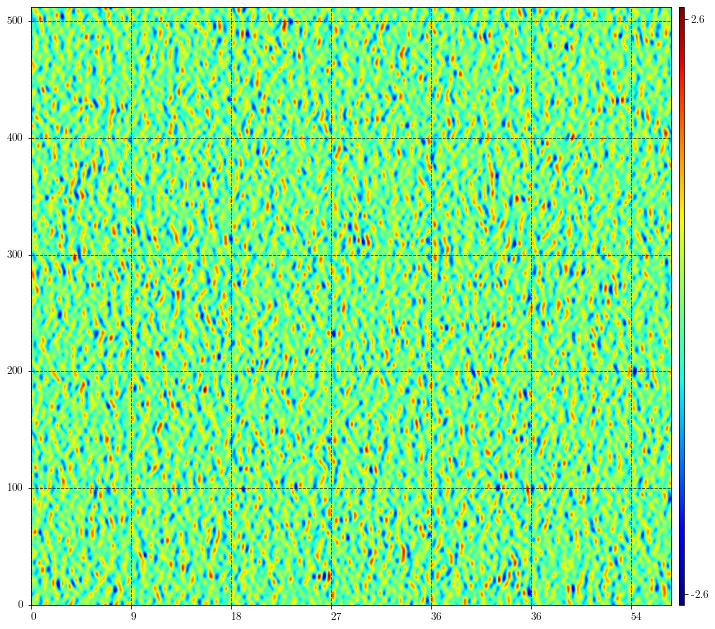

In [5]:
N = 256
M = 256
T = 512
L = 512
n, m = int(N // 2) - 1, int(M // 2) - 1
sms = int(L / (2*pi*np.sqrt(2)))
tms = int(np.sqrt(T/10))

sigma_time = 20
sigma_space = 15

np.random.seed(0)
tester = OrbitKS(state=4*np.random.randn(N,M), state_type='field', T=T, L=L).convert(to='modes')
tester.state = np.random.randn(*tester.state.shape)
space = np.abs((tester.L / (2 * pi)) * tester.elementwise_dxn(tester.parameters['dx']))
time = np.abs((tester.T / (2 * pi)) * tester.elementwise_dtn(tester.parameters['dt']))

mollifier = np.exp(-(space-sms)**2/(2*sigma_space**2)-(time-tms)**2/(2*sigma_time**2))

modes = 3*np.multiply(mollifier, tester.state)
test_orbit = OrbitKS(state=modes, state_type='modes', T=tester.T, L=tester.L)


good_large_guess2 = OrbitKS(state=np.sign(test_orbit.convert(to='modes').state) * np.abs(test_orbit.convert(to='modes').state)**(1./3.),
                                                                      state_type='modes', T=512, L=512).rescale(2.5)



good_large_guess2.plot(padding=True)

In [6]:
large_result = converge(good_large_guess)

Starting adj numerical method. Initial residual 21340.23160121043
........................Step number 2500 residual 19.762386209922465
........................Step number 5000 residual 8.982139516243546
........................Step number 7500 residual 5.62851396959022
........................Step number 10000 residual 4.594929047940307
........................Step number 12500 residual 3.929396746485603
........................Step number 15000 residual 3.4100635932453396
........................Step number 17500 residual 3.0038499473515485
........................Step number 20000 residual 2.674395342219975
........................Step number 22500 residual 2.3932596581787418
........................Step number 25000 residual 2.152370458393731
........................Step number 27500 residual 1.9553517130973326
........................Step number 30000 residual 1.7881062359145605
........................Step number 32500 residual 1.6460964021393496
........................Step numbe

........................Step number 290000 residual 0.1392936017824127
........................Step number 292500 residual 0.13770782831157014
........................Step number 295000 residual 0.1361293238224092
........................Step number 297500 residual 0.13455658101647447
........................Step number 300000 residual 0.13299273657327512
........................Step number 302500 residual 0.13144686598516106
........................Step number 305000 residual 0.12992995554967093
........................Step number 307500 residual 0.12844848949644194
........................Step number 310000 residual 0.12700298119048273
........................Step number 312500 residual 0.1255907643139492
........................Step number 315000 residual 0.12420850196684616
........................Step number 317500 residual 0.12285320130055044
........................Step number 320000 residual 0.12152241623800304
........................Step number 322500 residual 0.1202141901833

........................Step number 575000 residual 0.04656424086402477
........................Step number 577500 residual 0.04624773304486347
........................Step number 580000 residual 0.04593545172906379
........................Step number 582500 residual 0.045627368275146095
........................Step number 585000 residual 0.04532346491329854
........................Step number 587500 residual 0.04502373101922169
........................Step number 590000 residual 0.04472815911732932
........................Step number 592500 residual 0.04443674101549434
........................Step number 595000 residual 0.04414946443115033
........................Step number 597500 residual 0.04386631042892285
........................Step number 600000 residual 0.04358725193784952
........................Step number 602500 residual 0.04331225352619706
........................Step number 605000 residual 0.043041272464496697
........................Step number 607500 residual 0.04277426

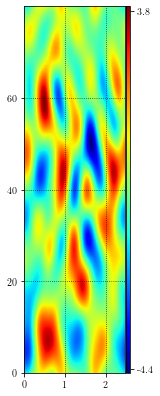

In [6]:
N = 64
M = 32
T = 80
L = 22
n, m = int(N // 2) - 1, int(M // 2) - 1
sms = int(L / (2*pi*np.sqrt(2)))
tms = int(np.sqrt(T/10))

sigma_time = 2
sigma_space = 2

np.random.seed(0)
tester = OrbitKS(state=4*np.random.randn(N,M), state_type='field', T=T, L=L).convert(to='modes')

space = np.abs((tester.L / (2 * pi)) * tester.elementwise_dxn(tester.parameters))
time = np.abs((tester.T / (2 * pi)) * tester.elementwise_dtn(tester.parameters))

mollifier = np.exp(-(space-sms)**2/(2*sigma_space**2)-(time-tms)**2/(2*sigma_time**2))

modes = 3*np.multiply(mollifier, tester.state)
test_orbit = OrbitKS(state=modes, state_type='modes', T=tester.T, L=tester.L)
test_orbit.plot()

#### Gaussian with different std

In [4]:
N = 256
M = 256
T = 512
L = 512
n, m = int(N // 2) - 1, int(M // 2) - 1
sms = int(L / (2*pi*np.sqrt(2)))
tms = 2

sigma_time = 20
sigma_space = 2

np.random.seed(0)
tester = OrbitKS(state=4*np.random.randn(N,M), state_type='field', T=T, L=L).convert(to='modes')

space = np.abs((tester.L / (2 * pi)) * tester.elementwise_dxn(tester.parameters))
time = np.abs((tester.T / (2 * pi)) * tester.elementwise_dtn(tester.parameters))

mollifier = np.exp(-(space-sms)**2/(2*sigma_space**2)-(time-tms)**2/(2*sigma_time**2))

modes = 3*np.multiply(mollifier, tester.state)
test_orbit = OrbitKS(state=modes, state_type='modes', T=tester.T, L=tester.L)

test_orbit.plot()
plt.show()

# "Modulated"

others methods : 

    1. truncation
    2. scaling by linear component
    3. scaling like sqrt((j-sms)**2)/sms
    4. only scaling after j > sms

In [14]:
N = 32
M = 32
T = 50
L = 22
n, m = int(N // 2) - 1, int(M // 2) - 1
sms = int(L / (2*pi*np.sqrt(2)))
tms = 1

np.random.seed(0)
tester = OrbitKS(state=4*np.random.randn(N,M), state_type='field', T=T, L=L).convert(to='modes')

# space = np.abs((tester.L / (2 * pi)) * tester.elementwise_dxn(tester.parameters))
# time = np.abs((tester.T / (2 * pi)) * tester.elementwise_dtn(tester.parameters))

space = np.abs((tester.L/(2*pi))*tester.elementwise_dxn(tester.parameters))
time = np.abs((tester.T/(2*pi))*tester.elementwise_dtn(tester.parameters))

abs_mollifier = (tester.elementwise_dxn(tester.parameters, power=2)
                       -tester.elementwise_dxn(tester.parameters, power=4))

modulated_time = time.copy()
modulated_time[modulated_time<=tms] = 1
modulated_time[modulated_time>tms] = 0 

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


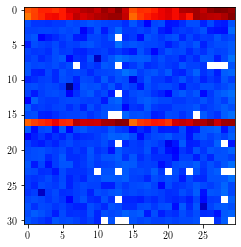

In [25]:
plt.imshow(np.log10(np.abs(test_orbit.rescale(3).convert(to='modes').state)), cmap='jet')

In [27]:
np.argmax(np.abs(test_orbit.rescale(3).convert(to='modes').state),axis=0)

array([27, 29, 15, 29, 27, 13, 29, 29, 11, 14, 11, 29, 29, 13,  0, 29, 13,
       27, 14, 27, 29, 13, 29, 27, 29, 28, 28, 29, 22, 14, 28],
      dtype=int64)

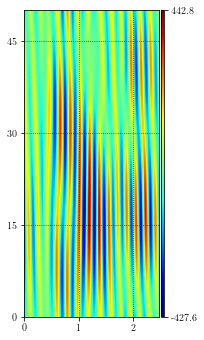

In [20]:
modes = np.multiply(modulated_time, np.multiply(abs_mollifier, tester.state))
test_orbit = OrbitKS(state=modes, state_type='modes', T=tester.T, L=tester.L).rescale(3)
test_orbit.plot()

In [66]:
import time
t0 = time.time()
result = converge(test_orbit, method='gradient', verbose=True)
t1 = time.time()
t1-t0

Starting gradient numerical method. Initial residual 11890232.99807573
########## Residual=8.553144406688565 after 3276 gradient descent iterations
########## Residual=4.257539414166595 after 6552 gradient descent iterations
########## Residual=2.5529087315342567 after 9828 gradient descent iterations
########## Residual=1.7078344689966374 after 13104 gradient descent iterations
########## Residual=1.2976409457736313 after 16380 gradient descent iterations
########## Residual=1.0918456574914475 after 19656 gradient descent iterations
########## Residual=0.9733576605116568 after 22932 gradient descent iterations
########## Residual=0.8939246295803658 after 26208 gradient descent iterations
########## Residual=0.8351021618593667 after 29484 gradient descent iterations
########## Residual=0.7888102250777127 after 32760 gradient descent iterations

Failed to converge. Maximum number of iterations reached. exiting with residual 0.7887086653205793


39.72904872894287

In [67]:
t2 = time.time()
result2 = converge(result.orbit, method='lstsq', preconditioning=False, orbit_tol=10**-14, verbose=True)
t3 = time.time()
t3-t2

Starting lstsq numerical method. Initial residual 0.7887086653205793
65555554434434333216655555554432100111112444578
Failed to converge. Exiting with residual 0.0007442827749576479


26.353543281555176

In [68]:
t4 = time.time()
result3 = converge(result2.orbit, method='gradient', preconditioning=False,  verbose=True)
t5 = time.time()
t5-t4

0.0009989738464355469

In [69]:
result3.orbit.residual()

0.0007442827749576479

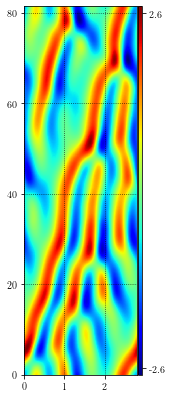

In [70]:
result3.orbit.plot()

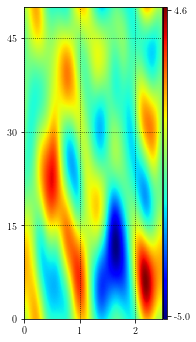

In [5]:
N = 32
M = 32
T = 50
L = 22
n, m = int(N // 2) - 1, int(M // 2) - 1
sms = int(L / (2*pi*np.sqrt(2)))
tms = 2

np.random.seed(0)
tester = OrbitKS(state=4*np.random.randn(N,M), state_type='field', T=T, L=L).convert(to='modes')

space = np.abs((tester.L / (2 * pi)) * tester.elementwise_dxn(tester.parameters))
time = np.abs((tester.T / (2 * pi)) * tester.elementwise_dtn(tester.parameters))
space[space<sms] = sms
abs_mollifier = np.exp(-1*(np.abs(space-sms)/sms))
modulated_time = time.copy()
modulated_time[modulated_time <= tms] = 1
modulated_time[modulated_time > tms] = 0

modes = 3*np.multiply(modulated_time, np.multiply(abs_mollifier, tester.state))
test_orbit = OrbitKS(state=modes, state_type='modes', T=tester.T, L=tester.L)

test_orbit.plot()
plt.show()

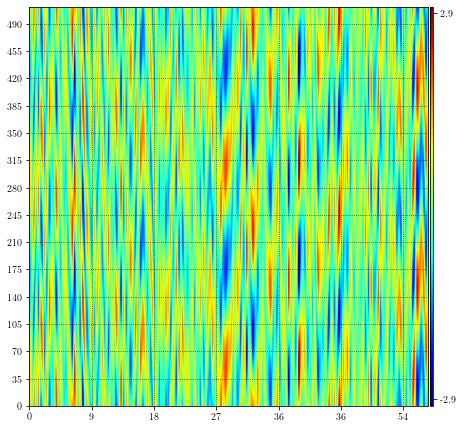

In [6]:
N = 256
M = 256
T = 512
L = 512
n, m = int(N // 2) - 1, int(M // 2) - 1
sms = int(L / (2*pi*np.sqrt(2)))
tms = 2

np.random.seed(0)
tester = OrbitKS(state=4*np.random.randn(N,M), state_type='field', T=T, L=L).convert(to='modes')

space = np.abs((tester.L / (2 * pi)) * tester.elementwise_dxn(tester.parameters))
time = np.abs((tester.T / (2 * pi)) * tester.elementwise_dtn(tester.parameters))
space[space<sms] = sms
abs_mollifier = np.exp(-1*(np.abs(space-sms)/sms))
modulated_time = time.copy()
modulated_time[modulated_time != tms] = 0
modulated_time[modulated_time == tms] = 1

modes = 3*np.multiply(modulated_time, np.multiply(abs_mollifier, tester.state))
test_orbit = OrbitKS(state=modes, state_type='modes', T=tester.T, L=tester.L)

test_orbit.plot()
plt.show()

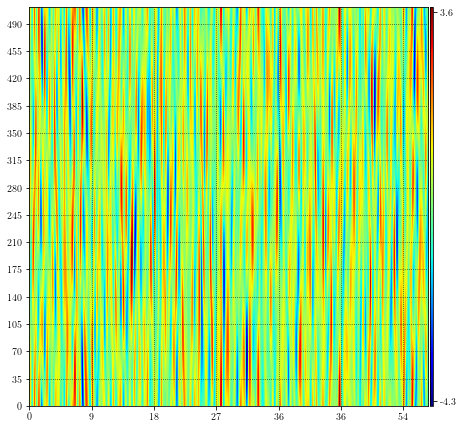

In [57]:
N = 256
M = 256
T = 512
L = 512
n, m = int(N // 2) - 1, int(M // 2) - 1
sms = int(L / (2*pi*np.sqrt(2)))
tms = 2

np.random.seed(0)
tester = OrbitKS(state=4*np.random.randn(N,M), state_type='field', T=T, L=L).convert(to='modes')

space = np.abs((tester.L / (2 * pi)) * tester.elementwise_dxn(tester.parameters))
time = np.abs((tester.T / (2 * pi)) * tester.elementwise_dtn(tester.parameters))

abs_mollifier = np.exp(-1*(np.abs(space-sms)/sms))

modulated_time = time.copy()
modulated_time[modulated_time <= tms] = 1
modulated_time[modulated_time > tms] = 0

modes = 3*np.multiply(modulated_time, np.multiply(abs_mollifier, tester.state))
test_orbit = OrbitKS(state=modes, state_type='modes', T=tester.T, L=tester.L)

test_orbit.plot()
plt.show()

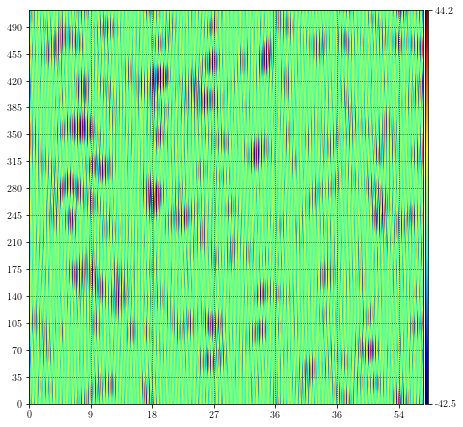

In [56]:
N = 256
M = 256
T = 512
L = 512
n, m = int(N // 2) - 1, int(M // 2) - 1
sms = int(L / (2*pi*np.sqrt(2)))
tms = int(np.sqrt(T//10))

np.random.seed(0)
tester = OrbitKS(state=4*np.random.randn(N,M), state_type='field', T=T, L=L).convert(to='modes')

space = np.abs((tester.L / (2 * pi)) * tester.elementwise_dxn(tester.parameters))
time = np.abs((tester.T / (2 * pi)) * tester.elementwise_dtn(tester.parameters))

lin_mollifier = (2*pi*space/L)**2-(2*pi*space/L)**4
lin_mollifier = lin_mollifier / np.max(lin_mollifier)

modulated_time = time.copy()
modulated_time[modulated_time <= tms] = 1
modulated_time[modulated_time > tms] = 0

modes = 3*np.multiply(modulated_time, np.multiply(lin_mollifier, tester.state))
test_orbit = OrbitKS(state=modes, state_type='modes', T=tester.T, L=tester.L)

test_orbit.plot()
plt.show()